# Model Exploration

__Overview:__ The purpose of this notebook is to compare different models and hyperparameters tested for this project. Note that this is not meant to be an exhausive explanation of everything that was tried, but rather a high-level collection of different analyses and visualizations that I used in my decision making process. I will provide some basic explanation of the steps involved and my thinking at various points throughout the notebook. That said the trend was as follows: most models performed very similarly, some performed distinctly worse, and in the end I decided on a Random Forest Classifier due to its speed, flexibility, and interpretability via feature importance.
<hr>

__Goal:__ Given the nature of this project, models are trained separately for each individual "seed artist". Therefore, hyperparameter tuning cannot just be run on a single train/test dataset. In order to evaluate the quality of different models, a list of 2000 random artists was pulled from Spotify's API with `get_random_artists()`, from which a subset of 200 were used for model comparisons. For each of the 200 "seed artists", the Spotify API was used to generate a network of related artists. That artist network was then used to pull thousands of similar tracks to serve as the training set.

My goal was to identify a model that worked well across all 200 test cases. In addition, it needed to be relatively quick to train (as this would be done live for a given artist input in the final dashboard), as well as interpretable (to inform the user of which audio features drive popularity). In this notebook I compare Logistic Regression, Random Forest Classification, and Support Vector Classification (with a linear kernel).

Relevant data for each artist has previously been pulled from the Spotify API via `save_random_artist_data()` and saved to `Data/data_artist_#.pkl`. Additionally, cross-validation of these models with different hyperparamters has been run via `save_cv_results.py` and saved to `Data/cv_results_artist_#.pkl`.

## Initial exploration of the 200 samples used

In [1]:
# Import data libraries
import numpy as np
import pandas as pd
import pickle
from collections import defaultdict

# Import plotting libraries
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
%matplotlib inline
import seaborn as sns; sns.set()

# Import spotify API tools, as well as modeling and plotting functions
from spotify_tools import *
from model_tools import *
from plot_tools import *

Before getting into the results it's also good to get a sense of the data being used. This first plot shows the distribution of follower counts in the 200 samples vs. the full list of 2000 random artists generated. I wanted to make sure that this 10% subsample isn't heavily biased towards bigger or smaller artists. The two distributions look pretty similar. If anything, the subsample is slightly weighted towards smaller artists, which is good considering they're more likely to want to use my product than a larger artist that already has a lot of resources behind their operation.

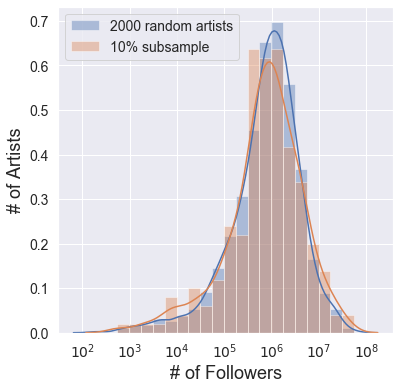

In [2]:
plot_follower_count(plot_legend=True)

Additionally, here are plots showing the distributions of different variables for the 200 seed artists:
1. How many songs are in each seed artist's library?
2. How big is the network of related artists used to generate each set of training data?
3. How many songs are in each set of training data?

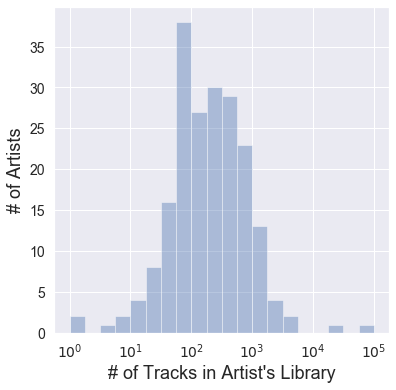

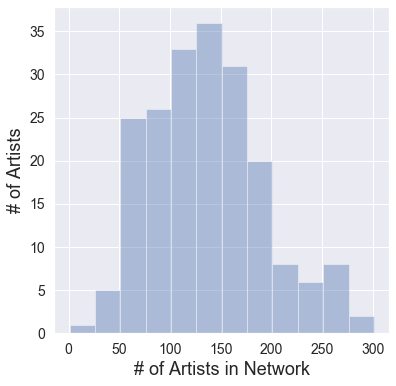

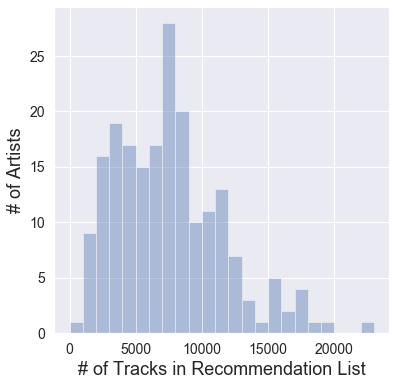

In [3]:
plot_tracklist_sizes()
plot_network_sizes()
plot_reclist_sizes()

## Load and prepare the data

To compare the models, first I need to load in all of the previously saved cross-validation results and store them in a list for further processing. Here I store the results as a list of dataframes, `df_list` with each entry holding the results for one model/hyperparameter combination. For each dataset and model, I also shuffled the classification labels to serve as a baseline training set. Those analagous dataframes are stored in `df_list_baseline`.

In [4]:
# Note that one of the artists (no.59) had too small of a library to generate a reasonable
# training set, so I skipped it in generating my 200 samples and went from 0-200 inclusive

# Load in the previously saved data
filerange = range(201)
results_list = []
for i_file in filerange:
    fpath = 'Data/cv_results_artist_{}.pkl'.format(i_file)
    if not os.path.exists(fpath):
        continue
    with open(fpath, 'rb') as f:
        results = pickle.load(f)
    results_list.append(results)    
    
# Get the list of models used
model_list = results_list[0][2]

# Pull out the results from the loaded data and store them in the lists
fname_list = []
df_list = [[]] * len(model_list)
df_list_baseline = [[]] * len(model_list)
for res in results_list:
    # Make sure that the models used is the same across all files
    if str(res[2]) != str(model_list):
        continue
    fname_list.append(res[0])
    for n, scores in enumerate(res[3]):
        if not df_list[n]:
            df_list[n] = [scores]
        else:
            df_list[n].append(scores)
    for n, scores in enumerate(res[4]):
        if not df_list_baseline[n]:
            df_list_baseline[n] = [scores]
        else:
            df_list_baseline[n].append(scores)

# Turn the results into dataframes
for n, df in enumerate(df_list):
    df_list[n] = pd.DataFrame(df)
for n, df in enumerate(df_list_baseline):
    df_list_baseline[n] = pd.DataFrame(df)

In [5]:
display(df_list[0].head(2))

,fit_time,score_time,train_score,test_score,holdout_score,y_pred,y_pred_proba
0,"[0.2510688304901123, 0.21869492530822754, 0.22...","[0.0, 0.015624523162841797, 0.0156221389770507...","[0.6093220338983051, 0.6101694915254238, 0.630...","[0.5864406779661017, 0.5796610169491525, 0.515...","[0.6015325670498084, 0.5862068965517241, 0.601...","[[1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0,...","[[[0.4931341669018152, 0.5068658330981848], [0..."
1,"[0.5307343006134033, 0.515512228012085, 0.4998...","[0.015621423721313477, 0.03124237060546875, 0....","[0.6338672768878718, 0.6363220494053065, 0.648...","[0.5923217550274223, 0.6446886446886447, 0.600...","[0.5767634854771784, 0.5975103734439834, 0.574...","[[0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1,...","[[[0.5323299515151573, 0.46767004848484267], [..."


## Add new score columns to DataFrame Lists

I used recall as the scorer for cross-validation for two main reasons. First, my final goal is to identify songs in the seed artist's library that should be more popular than they currently are (i.e. those that appear to be false negatives). Therefore I want to err against a model having too many false negatives during training. Second, because 'popular' songs are defined as the top quartile of popularity scores, they are by definition a minority class. Since I also want to understand which audio features drive popularity, and given their relative infrequency, I want to minimize the chances of misclassifying 1's as 0's.

That said, it could be useful to look at a few other metrics for these models. Recall of the holdout set has already been calculated, but in my exploration I considered a few other ideas.

In [6]:
# Generate a dataframe of the y_test values for computing other scores
y_test_list = []
for res in results_list:
    splits_val = res[1]
    y_test_list.append({'y_test':splits_val[3], 'y_test_baseline':splits_val[5]})

y_test_df = pd.DataFrame(y_test_list)

In [7]:
display(y_test_df.head(2))

,y_test,y_test_baseline
0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...","[1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, ..."
1,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, ..."


In [8]:
# Calculate precision of the holdout set
scorename = 'holdout_precision'

for mod in range(len(model_list)):
    df_list[mod][scorename] = None
    df_list_baseline[mod][scorename] = None
    for art in range(y_test_df.shape[0]):
        new_score = []
        new_score_baseline = []
        for fold in range(len(df_list[0]['y_pred'][0])):
            new_score.append(metrics.precision_score(y_test_df.loc[art, 'y_test'],
                                                     df_list[mod].loc[art, 'y_pred'][fold],
                                                     zero_division=0))
            new_score_baseline.append(metrics.precision_score(y_test_df.loc[art, 'y_test_baseline'],
                                                              df_list_baseline[mod].loc[art, 'y_pred'][fold],
                                                              zero_division=0))
        df_list[mod][scorename][art] = new_score
        df_list_baseline[mod][scorename][art] = new_score_baseline

In [9]:
# Calculatae F1 scores on the holdout set
scorename = 'holdout_f1'

for mod in range(len(model_list)):
    df_list[mod][scorename] = None
    df_list_baseline[mod][scorename] = None
    for art in range(y_test_df.shape[0]):
        new_score = []
        new_score_baseline = []
        for fold in range(len(df_list[0]['y_pred'][0])):
            new_score.append(metrics.f1_score(y_test_df.loc[art, 'y_test'],
                                                     df_list[mod].loc[art, 'y_pred'][fold],
                                                     zero_division=0))
            new_score_baseline.append(metrics.f1_score(y_test_df.loc[art, 'y_test_baseline'],
                                                              df_list_baseline[mod].loc[art, 'y_pred'][fold],
                                                              zero_division=0))
        df_list[mod][scorename][art] = new_score
        df_list_baseline[mod][scorename][art] = new_score_baseline

In [10]:
# Sum up the y_test values (should be ~25% of the data)
scorename = 'y_test_sum'

for mod in range(len(model_list)):
    df_list[mod][scorename] = None
    df_list_baseline[mod][scorename] = None
    for art in range(y_test_df.shape[0]):
        new_score = []
        new_score_baseline = []
        for fold in range(len(df_list[0]['y_pred'][0])):
            new_score.append(np.sum(y_test_df.loc[art, 'y_test']))
            new_score_baseline.append(np.sum(y_test_df.loc[art, 'y_test_baseline']))
        df_list[mod][scorename][art] = new_score
        df_list_baseline[mod][scorename][art] = new_score_baseline

In [11]:
# Sum up the y_pred values to get a sense of how many overall positive classifications were made
scorename = 'y_pred_sum'

for mod in range(len(model_list)):
    df_list[mod][scorename] = None
    df_list_baseline[mod][scorename] = None
    for art in range(y_test_df.shape[0]):
        new_score = []
        new_score_baseline = []
        for fold in range(len(df_list[0]['y_pred'][0])):
            new_score.append(np.sum(df_list[mod].loc[art, 'y_pred'][fold]))
            new_score_baseline.append(np.sum(df_list_baseline[mod].loc[art, 'y_pred'][fold]))
        df_list[mod][scorename][art] = new_score
        df_list_baseline[mod][scorename][art] = new_score_baseline

In [12]:
# How many more positive predictions were made relative to the actual number of positive classes?
# Given that I'm optimizing for recall, some models may compensate by over-assigning the positive class
scorename = 'y_pred_ratio'

for mod in range(len(model_list)):
    df_list[mod][scorename] = None
    df_list_baseline[mod][scorename] = None
    for art in range(y_test_df.shape[0]):
        new_score = []
        new_score_baseline = []
        for fold in range(len(df_list[0]['y_pred'][0])):
            new_score.append(np.sum(df_list[mod].loc[art, 'y_pred'][fold])
                             / np.sum(y_test_df.loc[art, 'y_test']))
            new_score_baseline.append(np.sum(df_list_baseline[mod].loc[art, 'y_pred'][fold])
                                      / np.sum(y_test_df.loc[art, 'y_test_baseline']))
        df_list[mod][scorename][art] = new_score
        df_list_baseline[mod][scorename][art] = new_score_baseline

In [13]:
# Calculate ROC Area Under the Curve (along with FPR and TPR)
# Calculate Average Precision Score (from the precision-recall curve)

for mod in range(len(model_list)): 
    for scorename in ['fpr', 'tpr', 'roc_thresh', 'precision', 'recall', 'pr_thresh', 'roc_auc', 'ap_score']:
        df_list[mod][scorename] = None
        df_list_baseline[mod][scorename] = None 
        
    if df_list[mod].loc[0, 'y_pred_proba'][0] is not None:        
        for art in range(y_test_df.shape[0]):
            roc_auc_list = []
            ap_score_list = []
            roc_auc_baseline_list = []
            ap_score_baseline_list = []
            
            y_true = y_test_df.loc[art, 'y_test']
            y_true_baseline = y_test_df.loc[art, 'y_test_baseline']
            
            y_prob_list = []
            y_prob_baseline_list = []
            
            for fold in range(len(df_list[0]['y_pred'][0])):
                y_prob = df_list[mod].loc[art, 'y_pred_proba'][fold][:,1]
                y_prob_list.append(y_prob)

                roc_auc = metrics.roc_auc_score(y_true, y_prob)
                ap_score = metrics.average_precision_score(y_true, y_prob)
                roc_auc_list.append(roc_auc)
                ap_score_list.append(ap_score)

                y_prob_baseline = df_list_baseline[mod].loc[art, 'y_pred_proba'][fold][:,1]
                y_prob_baseline_list.append(y_prob_baseline)

                roc_auc_baseline = metrics.roc_auc_score(y_true_baseline, y_prob_baseline)
                ap_score_baseline = metrics.average_precision_score(y_true_baseline, y_prob_baseline)
                roc_auc_baseline_list.append(roc_auc_baseline)
                ap_score_baseline_list.append(ap_score_baseline)

            fpr, tpr, roc_thresh = metrics.roc_curve(y_true,
                                                     np.mean(y_prob_list, axis=0))
            precision, recall, pr_thresh = metrics.precision_recall_curve(y_true,
                                                                          np.mean(y_prob_list, axis=0))
            fpr_baseline, tpr_baseline, roc_thresh_baseline = metrics.roc_curve(y_true_baseline,
                                                                                np.mean(y_prob_baseline_list, axis=0))
            precision_baseline, recall_baseline, pr_thresh_baseline = metrics.precision_recall_curve(y_true_baseline,
                                                                                                     np.mean(y_prob_baseline_list,
                                                                                                             axis=0))
            
            df_list[mod]['fpr'][art] = fpr
            df_list[mod]['tpr'][art] = tpr
            df_list[mod]['roc_thresh'][art] = roc_thresh
            df_list[mod]['precision'][art] = precision
            df_list[mod]['recall'][art] = recall
            df_list[mod]['pr_thresh'][art] = pr_thresh
            df_list[mod]['roc_auc'][art] = roc_auc_list
            df_list[mod]['ap_score'][art] = ap_score_list
            df_list_baseline[mod]['fpr'][art] = fpr_baseline
            df_list_baseline[mod]['tpr'][art] = tpr_baseline
            df_list_baseline[mod]['roc_thresh'][art] = roc_thresh_baseline
            df_list_baseline[mod]['precision'][art] = precision_baseline
            df_list_baseline[mod]['recall'][art] = recall_baseline
            df_list_baseline[mod]['pr_thresh'][art] = pr_thresh_baseline
            df_list_baseline[mod]['roc_auc'][art] = roc_auc_baseline_list
            df_list_baseline[mod]['ap_score'][art] = ap_score_baseline_list
    else:
        for art in range(y_test_df.shape[0]):
            df_list[mod]['fpr'][art] = np.nan
            df_list[mod]['tpr'][art] = np.nan
            df_list[mod]['roc_thresh'][art] = np.nan
            df_list[mod]['precision'][art] = np.nan
            df_list[mod]['recall'][art] = np.nan
            df_list[mod]['pr_thresh'][art] = np.nan
            df_list[mod]['roc_auc'][art] = np.nan
            df_list[mod]['ap_score'][art] = np.nan
            df_list_baseline[mod]['fpr'][art] = np.nan
            df_list_baseline[mod]['tpr'][art] = np.nan
            df_list_baseline[mod]['roc_thresh'][art] = np.nan
            df_list_baseline[mod]['precision'][art] = np.nan
            df_list_baseline[mod]['recall'][art] = np.nan
            df_list_baseline[mod]['pr_thresh'][art] = np.nan
            df_list_baseline[mod]['roc_auc'][art] = np.nan
            df_list_baseline[mod]['ap_score'][art] = np.nan

In [14]:
display(df_list[0].head(2))

,fit_time,score_time,train_score,test_score,holdout_score,y_pred,y_pred_proba,holdout_precision,holdout_f1,y_test_sum,y_pred_sum,y_pred_ratio,fpr,tpr,roc_thresh,precision,recall,pr_thresh,roc_auc,ap_score
0,"[0.2510688304901123, 0.21869492530822754, 0.22...","[0.0, 0.015624523162841797, 0.0156221389770507...","[0.6093220338983051, 0.6101694915254238, 0.630...","[0.5864406779661017, 0.5796610169491525, 0.515...","[0.6015325670498084, 0.5862068965517241, 0.601...","[[1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0,...","[[[0.4931341669018152, 0.5068658330981848], [0...","[0.35926773455377575, 0.3608490566037736, 0.35...","[0.44985673352435523, 0.4467153284671533, 0.44...","[261, 261, 261, 261, 261]","[437, 424, 438, 402, 425]","[1.6743295019157087, 1.6245210727969348, 1.678...","[0.0, 0.001310615989515072, 0.0013106159895150...","[0.0, 0.0, 0.0038314176245210726, 0.0038314176...","[1.6101690122985275, 0.6101690122985275, 0.609...","[0.25918570009930486, 0.2584493041749503, 0.25...","[1.0, 0.9961685823754789, 0.9961685823754789, ...","[0.3971650012315328, 0.39792523753465464, 0.39...","[0.6433266547154557, 0.6494604379767303, 0.641...","[0.3772292515025668, 0.37907715745515325, 0.37..."
1,"[0.5307343006134033, 0.515512228012085, 0.4998...","[0.015621423721313477, 0.03124237060546875, 0....","[0.6338672768878718, 0.6363220494053065, 0.648...","[0.5923217550274223, 0.6446886446886447, 0.600...","[0.5767634854771784, 0.5975103734439834, 0.574...","[[0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1,...","[[[0.5323299515151573, 0.46767004848484267], [...","[0.2979635584137192, 0.3028391167192429, 0.296...","[0.3929328621908127, 0.4019539427773901, 0.391...","[482, 482, 482, 482, 482]","[933, 951, 934, 972, 889]","[1.9356846473029046, 1.9730290456431536, 1.937...","[0.0, 0.0, 0.0, 0.0007017543859649122, 0.00070...","[0.0, 0.002074688796680498, 0.0041493775933609...","[1.580260161532534, 0.580260161532534, 0.57873...","[0.25583864118895966, 0.25544344131704727, 0.2...","[1.0, 0.9979253112033195, 0.9979253112033195, ...","[0.3830154346216508, 0.3858946819332233, 0.387...","[0.5864046007134017, 0.5924255659896629, 0.587...","[0.312076316702652, 0.32466287692962914, 0.321..."


## Take means and standard deviations of the DF lists

Because 5-fold cross-validation was run for each model, every cell contains an array of length 5 with each of these values, so the next step is to take the mean and standard deviation within each cell. After that I can take the mean and standard deviation across artists for each model and generate summary values in new dataframes

In [15]:
# Create new dataframe lists with the mean and std of each cell
df_list_mean = []
df_list_std = []
df_list_baseline_mean = []
df_list_baseline_std = []

for df in df_list:
    df_mean = df.copy().drop(['y_pred', 'y_pred_proba', 'tpr', 'fpr', 'roc_thresh', 'precision', 'recall', 'pr_thresh'],
                             axis=1).applymap(np.mean)
    df_std = df.copy().drop(['y_pred', 'y_pred_proba', 'tpr', 'fpr', 'roc_thresh', 'precision', 'recall', 'pr_thresh'],
                            axis=1).applymap(np.std)
    df_list_mean.append(df_mean)
    df_list_std.append(df_std)
    
for df in df_list_baseline:
    df_mean = df.copy().drop(['y_pred', 'y_pred_proba', 'tpr', 'fpr', 'roc_thresh', 'precision', 'recall', 'pr_thresh'],
                             axis=1).applymap(np.mean)
    df_std = df.copy().drop(['y_pred', 'y_pred_proba', 'tpr', 'fpr', 'roc_thresh', 'precision', 'recall', 'pr_thresh'],
                            axis=1).applymap(np.std)
    df_list_baseline_mean.append(df_mean)
    df_list_baseline_std.append(df_std)

In [16]:
# Take the column-wise (across artists) mean and std for each of those new dataframes

# The mean and std of the mean values
model_mean_mean = []
model_mean_std = []
model_baseline_mean_mean = []
model_baseline_mean_std = []

# The mean and std of the standard deviation values
model_std_mean = []
model_std_std = []
model_baseline_std_mean = []
model_baseline_std_std = []

for df in df_list_mean:
    mean_vals = dict(df.copy().mean(axis=0))
    std_vals = dict(df.copy().std(axis=0))
    model_mean_mean.append(mean_vals)
    model_mean_std.append(std_vals)
for df in df_list_std:
    mean_vals = dict(df.copy().mean(axis=0))
    std_vals = dict(df.copy().std(axis=0))
    model_std_mean.append(mean_vals)
    model_std_std.append(std_vals)
for df in df_list_baseline_mean:
    mean_vals = dict(df.copy().mean(axis=0))
    std_vals = dict(df.copy().std(axis=0))
    model_baseline_mean_mean.append(mean_vals)
    model_baseline_mean_std.append(std_vals)
for df in df_list_baseline_std:
    mean_vals = dict(df.copy().mean(axis=0))
    std_vals = dict(df.copy().std(axis=0))
    model_baseline_std_mean.append(mean_vals)
    model_baseline_std_std.append(std_vals)
    
model_mean_mean = pd.DataFrame(model_mean_mean)
model_mean_std = pd.DataFrame(model_mean_std)
model_std_mean = pd.DataFrame(model_std_mean)
model_std_std = pd.DataFrame(model_std_std)
model_baseline_mean_mean = pd.DataFrame(model_baseline_mean_mean)
model_baseline_mean_std = pd.DataFrame(model_baseline_mean_std)
model_baseline_std_mean = pd.DataFrame(model_baseline_std_mean)
model_baseline_std_std = pd.DataFrame(model_baseline_std_std)

In [17]:
# So far df_list and df_list_baseline have been separated, but here I also
# calculate the ratio of the real vs. baseline scores for each model/artist combination
df_list_BLratio = [[]] * len(model_list)

for n in range(len(model_list)):
    df1 = df_list_mean[n]
    df2 = df_list_baseline_mean[n]
    ratio = df1 / df2
    ratio = ratio.replace([np.inf], np.nan)
    df_list_BLratio[n] = ratio
    
model_ratio_mean = []
model_ratio_std = []
    
for df in df_list_BLratio:
    mean_vals = dict(df.copy().mean(axis=0))
    std_vals = dict(df.copy().std(axis=0))
    model_ratio_mean.append(mean_vals)
    model_ratio_std.append(std_vals)

model_ratio_mean = pd.DataFrame(model_ratio_mean)
model_ratio_std = pd.DataFrame(model_ratio_std)

The main summaries I care about are the mean and standard deviation of the models across artists, which are stored in `model_mean_mean` and `model_mean_std` (and the baseline values in `model_baseline_mean_mean` and `model_baseline_mean_std`). It's also useful to be able to look at the _within-artist_ ratios between the real data and the randomized baseline data, stored in `model_ratio_mean` and `model_ratio_std`.

These summary tables are useful for getting point estimates of the data, but plotting the distributions across artists in the next section is ultimately more valuable.

In [18]:
# Abbreviations of the different models and hyperparameters, for quick reference
model_names = ['RF50-2','RF50-4','RF50-6','RF50-8','RF50-10','RF50-12',
               'RF100-2','RF100-4','RF100-6','RF100-8','RF100-10','RF100-12',
               'RF200-2','RF200-4','RF200-6','RF200-8','RF200-10','R200-12',
               'LRl1-a','LRl1-b','LRl1-c','LRl1-d','LRl1-e',
               'LRl2-a','LRl2-b','LRl2-c','LRl2-d','LRl2-e',
               'SVC-a','SVC-b','SVC-c','SVC-d','SVC-e']

In [19]:
model_mean_mean['model'] = model_names
display(model_mean_mean.set_index('model'))

,fit_time,score_time,train_score,test_score,holdout_score,holdout_precision,holdout_f1,y_test_sum,y_pred_sum,y_pred_ratio,roc_auc,ap_score
model,,,,,,,,,,,,
RF50-2,0.359845,0.016394,0.649600,0.610818,0.610933,0.331285,0.426253,294.785,564.576,1.862698,0.617693,0.359116
RF50-4,0.445253,0.017222,0.669635,0.581807,0.581209,0.341936,0.427342,294.785,526.049,1.715648,0.626314,0.368486
RF50-6,0.539845,0.017940,0.718074,0.531690,0.529601,0.353428,0.419865,294.785,473.845,1.514080,0.629653,0.371808
RF50-8,0.629786,0.019781,0.793199,0.455675,0.452708,0.365177,0.398053,294.785,403.174,1.255112,0.628251,0.370595
RF50-10,0.712757,0.021639,0.874562,0.366182,0.363841,0.378967,0.362496,294.785,320.599,0.972638,0.626237,0.367866
RF50-12,0.783377,0.022853,0.938104,0.277659,0.275447,0.391370,0.313011,294.785,238.971,0.710287,0.623095,0.364818
RF100-2,0.687021,0.026223,0.648545,0.609159,0.608870,0.332267,0.426644,294.785,561.651,1.851243,0.618744,0.360957
RF100-4,0.881717,0.028264,0.670799,0.582203,0.581231,0.343205,0.428373,294.785,524.895,1.710133,0.627598,0.370215
RF100-6,1.083508,0.030927,0.721142,0.531055,0.528885,0.355733,0.420981,294.785,472.131,1.504025,0.631049,0.373774


In [20]:
model_ratio_mean['model'] = model_names
display(model_ratio_mean.set_index('model'))

,fit_time,score_time,train_score,test_score,holdout_score,holdout_precision,holdout_f1,y_test_sum,y_pred_sum,y_pred_ratio,roc_auc,ap_score
model,,,,,,,,,,,,
RF50-2,1.045544,1.155110,1.199341,1.408835,1.405777,1.267854,1.310122,1.0,1.118674,1.118674,1.233851,1.345319
RF50-4,1.003420,1.055042,1.133723,1.549908,1.546822,1.310717,1.393537,1.0,1.186988,1.186988,1.252012,1.381131
RF50-6,0.998048,1.053892,1.078657,1.786624,1.778145,1.355670,1.522321,1.0,1.317276,1.317276,1.257905,1.391568
RF50-8,0.995169,1.078825,1.044459,2.109825,2.107814,1.400541,1.716572,1.0,1.503142,1.503142,1.256026,1.387865
RF50-10,0.987451,1.069985,1.034189,2.598659,2.547285,1.458194,2.018549,1.0,1.740377,1.740377,1.250888,1.378224
RF50-12,0.978792,1.091716,1.028185,3.129672,3.075492,1.512187,2.431639,1.0,1.988503,1.988503,1.246338,1.367681
RF100-2,1.002277,1.027650,1.188376,1.420189,1.409094,1.270619,1.313517,1.0,1.119475,1.119475,1.236153,1.352256
RF100-4,0.995656,1.008745,1.121852,1.588343,1.579034,1.313229,1.407949,1.0,1.210259,1.210259,1.253092,1.386694
RF100-6,1.003096,1.059392,1.058964,1.890025,1.876211,1.359335,1.566202,1.0,1.386507,1.386507,1.261384,1.399973


## Model comparison plots via distributions across artists

Here I plot the distributions summarized in the point estimates above. To compare the models, I'm looking primarily at the holdout set score.

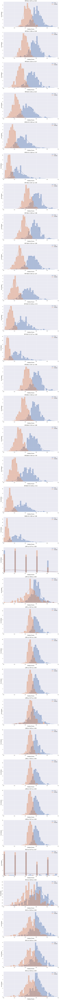

In [21]:
# Plot the holdout scores for the different models, with the true data and the shuffled (baseline) data on the same axes
col_choice = ['holdout_score']
binning = np.array(range(0,40))/40

fig, axs = plt.subplots(len(model_names), figsize = (16,300))

for mod in range(len(model_names)):
    plt.sca(axs[mod])
    _ = sns.distplot(df_list_mean[mod][col_choice], label='True', bins=binning)
    _ = sns.distplot(df_list_baseline_mean[mod][col_choice], label='Shuffled', bins=binning)
    plt.title('{}: {:.2f} vs. {:.2f}'.format(model_names[mod],
                                       model_mean_mean.loc[mod, col_choice][0],
                                       model_baseline_mean_mean.loc[mod, col_choice][0]),
                                       fontsize=20)
    plt.xlabel('Holdout Score', fontsize=18)
    plt.xlim(0, 1)
    plt.xticks(fontsize=14)
    plt.ylabel('# of Artists', fontsize=18)
    plt.yticks(fontsize=14)
    plt.legend(loc='upper right', fontsize=14)

Overall the Random Forest Classifier (RFC) and the Logistic Regression (LR) performed similiarly. The RFC tended to overfit as max depth was increased, and increasing the number of estimators mostly just increased fit time with little performance change. The LR didn't change much between L1 and L2 regularization, except for when the smallest regularization coefficient was used. The Support Vector Classifier (SVC) tended to be much more variable and had worse fit times, so it was easy to exclude in favor of the other two moving forward. These trends can be seen much more clearly via the tuning curves below.

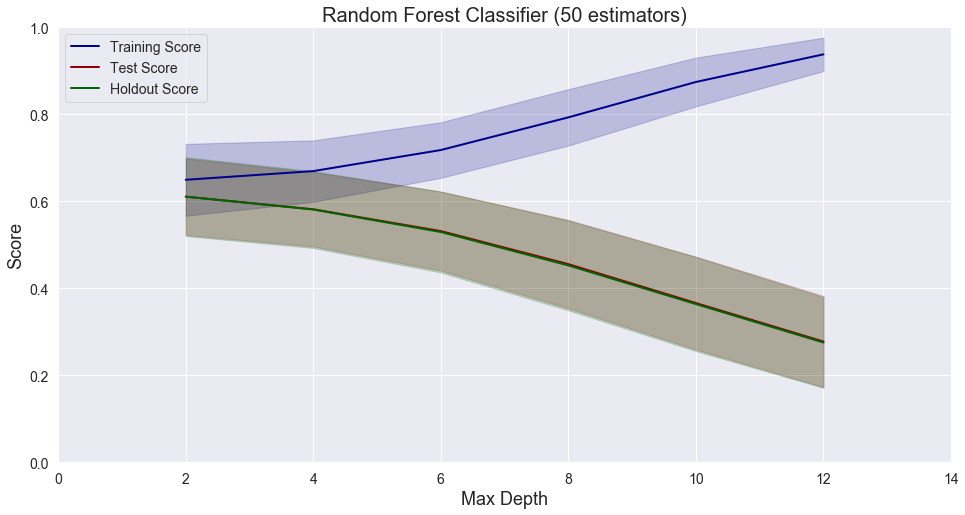

In [22]:
# Plot the tuning curve for RFC by max depth for 50 estimators

col_choices = ['train_score', 'test_score', 'holdout_score']
col_names = ['Training Score', 'Test Score', 'Holdout Score']

subset = slice(0,6)

means = defaultdict(list)
stds = defaultdict(list)
for n, col in enumerate(col_choices):
    means[col_names[n]] = model_mean_mean.to_dict(orient='list')[col][subset]
    stds[col_names[n]] = model_mean_std.to_dict(orient='list')[col][subset]

var_range = [2, 4, 6, 8, 10, 12]
colors = ['darkblue', 'darkred', 'darkgreen']
labels = ['Random Forest Classifier (50 estimators)', 'Max Depth', 'Score']

plot_tuning_curve(means, stds, var_range, label_vals=labels, color_vals=colors, ymax=1, logx=False)

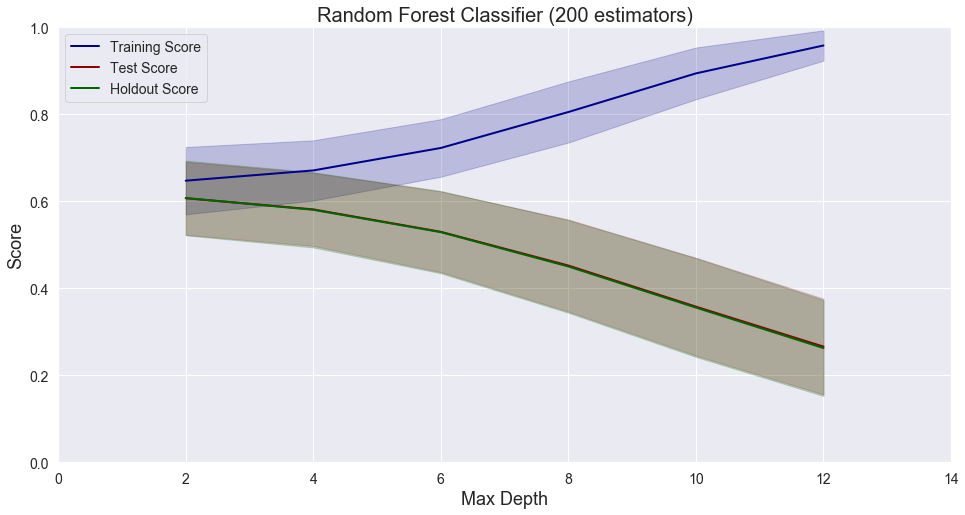

In [23]:
# Plot the tuning curve for RFC by max depth for 200 estimators

col_choices = ['train_score', 'test_score', 'holdout_score']
col_names = ['Training Score', 'Test Score', 'Holdout Score']

subset = slice(12,18)

means = defaultdict(list)
stds = defaultdict(list)
for n, col in enumerate(col_choices):
    means[col_names[n]] = model_mean_mean.to_dict(orient='list')[col][subset]
    stds[col_names[n]] = model_mean_std.to_dict(orient='list')[col][subset]

var_range = [2, 4, 6, 8, 10, 12]
colors = ['darkblue', 'darkred', 'darkgreen']
labels = ['Random Forest Classifier (200 estimators)', 'Max Depth', 'Score']

plot_tuning_curve(means, stds, var_range, label_vals=labels, color_vals=colors, ymax=1, logx=False)

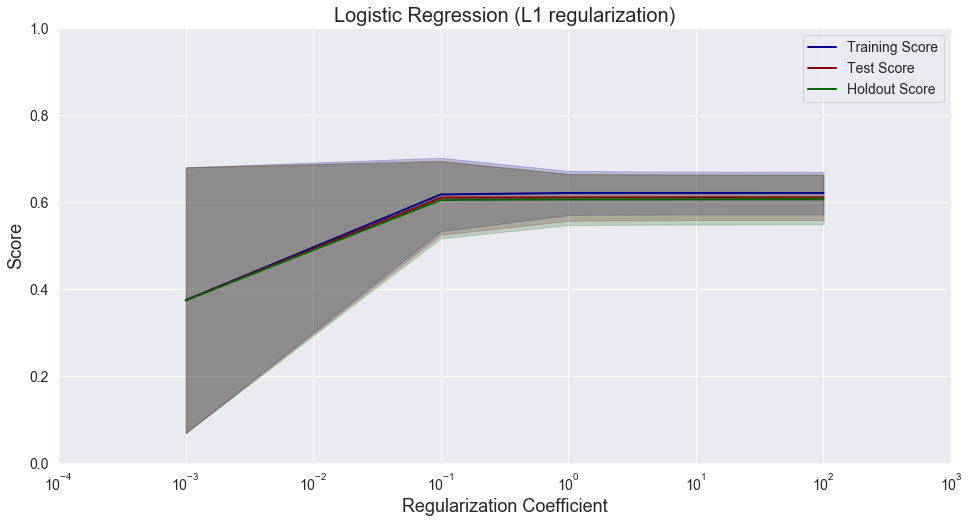

In [24]:
# Plot the tuning curve for LR with L1 regularization

col_choices = ['train_score', 'test_score', 'holdout_score']
col_names = ['Training Score', 'Test Score', 'Holdout Score']

subset = slice(18,23)

means = defaultdict(list)
stds = defaultdict(list)
for n, col in enumerate(col_choices):
    means[col_names[n]] = model_mean_mean.to_dict(orient='list')[col][subset]
    stds[col_names[n]] = model_mean_std.to_dict(orient='list')[col][subset]

var_range = [.001, .1, 1, 10, 100]
colors = ['darkblue', 'darkred', 'darkgreen']
labels = ['Logistic Regression (L1 regularization)', 'Regularization Coefficient', 'Score']

plot_tuning_curve(means, stds, var_range, label_vals=labels, color_vals=colors, ymax=1, logx=True)

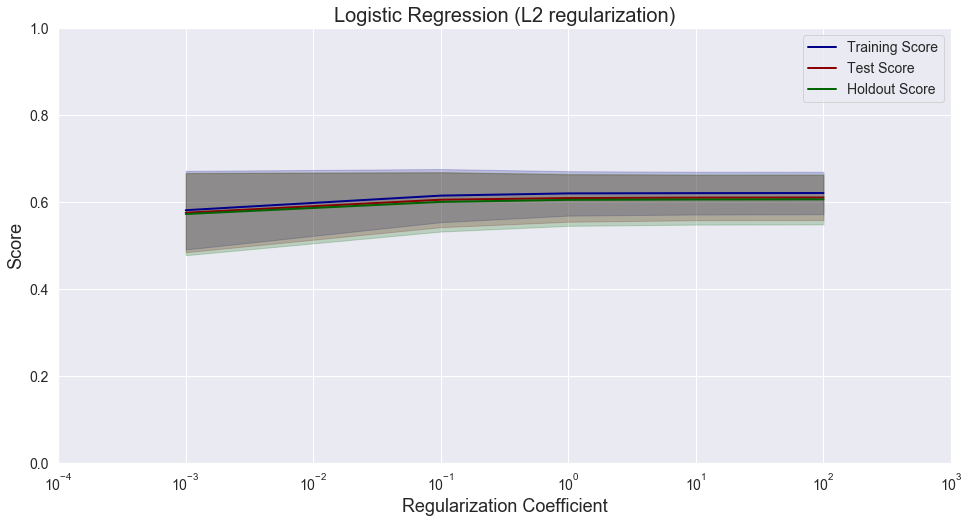

In [25]:
# Plot the tuning curve for LR with L2 regularization

col_choices = ['train_score', 'test_score', 'holdout_score']
col_names = ['Training Score', 'Test Score', 'Holdout Score']

subset = slice(23,28)

means = defaultdict(list)
stds = defaultdict(list)
for n, col in enumerate(col_choices):
    means[col_names[n]] = model_mean_mean.to_dict(orient='list')[col][subset]
    stds[col_names[n]] = model_mean_std.to_dict(orient='list')[col][subset]

var_range = [.001, .1, 1, 10, 100]
colors = ['darkblue', 'darkred', 'darkgreen']
labels = ['Logistic Regression (L2 regularization)', 'Regularization Coefficient', 'Score']

plot_tuning_curve(means, stds, var_range, label_vals=labels, color_vals=colors, ymax=1, logx=True)

## Evaluate ROC and Precision-Recall Curves

Lastly, I focused on the RFC and LR models, looking at the distributions of the ROC AUC and the Average Precision score, similar to the plots for the holdout scores above. Below that I plot the ROC curves and the Precision-Recall curves. Overall these scores show similar trends to what has already been noted.

C:\Users\Masaa\Anaconda3\envs\insight\lib\site-packages\seaborn\distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Masaa\Anaconda3\envs\insight\lib\site-packages\seaborn\distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


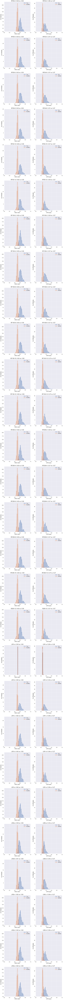

In [26]:
# Plot the ROC AUC and AP scores for the different models,
# with the true data and the shuffled (baseline) data on the same axes
col_choice = ['roc_auc', 'ap_score']
binning = np.array(range(0,40))/40

fig, axs = plt.subplots(28, 2, figsize = (16,280))

for mod in range(28):
    plot_col = 0
    plt.sca(axs[mod][plot_col])
    _ = sns.distplot(df_list_mean[mod][col_choice[plot_col]], label='True', bins=binning)
    _ = sns.distplot(df_list_baseline_mean[mod][col_choice[plot_col]], label='Shuffled', bins=binning)
    plt.title('{}: {:.2f} vs. {:.2f}'.format(model_names[mod],
                                       model_mean_mean.loc[mod, col_choice[plot_col]],
                                       model_baseline_mean_mean.loc[mod, col_choice[plot_col]]),
                                       fontsize=20)
    plt.xlabel('ROC AUC', fontsize=18)
    plt.xlim(0, 1)
    plt.xticks(fontsize=14)
    plt.ylabel('# of Artists', fontsize=18)
    plt.yticks(fontsize=14)
    plt.legend(loc='upper right', fontsize=14)

    plot_col = 1
    plt.sca(axs[mod][plot_col])
    _ = sns.distplot(df_list_mean[mod][col_choice[plot_col]], label='True', bins=binning)
    _ = sns.distplot(df_list_baseline_mean[mod][col_choice[plot_col]], label='Shuffled', bins=binning)
    plt.title('{}: {:.2f} vs. {:.2f}'.format(model_names[mod],
                                       model_mean_mean.loc[mod, col_choice[plot_col]],
                                       model_baseline_mean_mean.loc[mod, col_choice[plot_col]]),
                                       fontsize=20)
    plt.xlabel('AP Score', fontsize=18)
    plt.xlim(0, 1)
    plt.xticks(fontsize=14)
    plt.ylabel('# of Models', fontsize=18)
    plt.yticks(fontsize=14)
    plt.legend(loc='upper right', fontsize=14)
    
    
    
# Note the warnings are generated because the smallest LR regularization leads to a lack of variance,
# causing problems with drawing the kernel density estimation. This warning is irrelevant for my purposes.

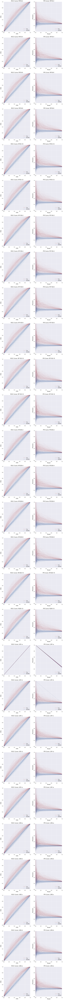

In [27]:
# Plot the ROC curves and the Precision-Recall curves

# Set up the custom legend to avoid repeated copies
custom_lines = [Line2D([0], [0], color='r', lw=1),
                Line2D([0], [0], color='b', lw=1)]

fig, axs = plt.subplots(28, 2, figsize = (16,280))

for mod in range(28):
    plt.sca(axs[mod][0])
    for art in range(df_list[mod].shape[0]):
        plt.plot(df_list[mod].loc[art, 'fpr'], df_list[mod].loc[art, 'tpr'],
                 label='True', alpha=0.02, color='r')
        plt.plot(df_list_baseline[mod].loc[art, 'fpr'], df_list_baseline[mod].loc[art, 'tpr'],
                 label='Shuffled', alpha=0.02, color='b')
    plt.title('ROC Curve: {}'.format(model_names[mod]), fontsize=20)
    plt.xlabel('FPR', fontsize=18)
    plt.xlim(0, 1)
    plt.xticks(fontsize=14)
    plt.ylabel('TPR', fontsize=18)
    plt.ylim(0, 1)
    plt.yticks(fontsize=14)
    plt.legend(custom_lines, ['True', 'Shuffled'], loc='lower right', fontsize=14)

    plt.sca(axs[mod][1])
    for art in range(df_list[mod].shape[0]):
        plt.plot(df_list[mod].loc[art, 'recall'], df_list[mod].loc[art, 'precision'],
                 label='True', alpha=0.02, color='r')
        plt.plot(df_list_baseline[mod].loc[art, 'recall'], df_list_baseline[mod].loc[art, 'precision'],
                 label='Shuffled', alpha=0.02, color='b')
    plt.title('PR Curve: {}'.format(model_names[mod]), fontsize=20)
    plt.xlabel('Recall', fontsize=18)
    plt.xlim(0, 1)
    plt.xticks(fontsize=14)
    plt.ylabel('Precision', fontsize=18)
    plt.ylim(0, 1)
    plt.yticks(fontsize=14)
    plt.legend(custom_lines, ['True', 'Shuffled'], loc='lower right', fontsize=14)

__Conclusion:__ As I mentioned at the beginning, I found similar performance between RFC and LR, with SVC being slower and more variable. RFC tended to overfit with greater values of max depth, and increasing the number of estimators didn't cause much performance increase. LR performed terribly with too small of a regularization coefficient, but otherwise was consistent in it's performance. Ultimately, I ended up choosing a Random Forest Classifier (n_estimators=100, max_depth=2). It is possible that more complicated models could have acheived better performance in terms of recall scores, but at the cost of speed and interpretability, both of which were important to me for the implementation of this project.